In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

Loading data for Analysis

In [4]:
files=os.listdir(r'C:\Users\mlvka\OneDrive\Desktop\projects\Uber Trips Analysis')[-7:]
files

['uber-raw-data-apr14 - uber-raw-data-apr14.csv',
 'uber-raw-data-aug14 - uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14 - uber-raw-data-jul14.csv',
 'uber-raw-data-jun14 - uber-raw-data-jun14.csv',
 'uber-raw-data-may14 - uber-raw-data-may14.csv',
 'uber-raw-data-sep14 - uber-raw-data-sep14.csv']

In [5]:
files.remove('uber-raw-data-janjune-15.csv')           

In [6]:
files

['uber-raw-data-apr14 - uber-raw-data-apr14.csv',
 'uber-raw-data-aug14 - uber-raw-data-aug14.csv',
 'uber-raw-data-jul14 - uber-raw-data-jul14.csv',
 'uber-raw-data-jun14 - uber-raw-data-jun14.csv',
 'uber-raw-data-may14 - uber-raw-data-may14.csv',
 'uber-raw-data-sep14 - uber-raw-data-sep14.csv']

In [7]:
path=r'C:\Users\mlvka\OneDrive\Desktop\projects\Uber Trips Analysis'
final=pd.DataFrame()
for file in files:
    df=pd.read_csv(path+"/"+file,encoding='utf-8')
    final=pd.concat([df, final])

In [8]:
final.shape

(4534327, 4)

Data preparation/preprocessing

In [9]:
df=final.copy()

In [10]:
df.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [11]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [12]:
df['Date/Time']=pd.to_datetime(df['Date/Time'], format="%m/%d/%Y %H:%M:%S")

In [13]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [14]:
df['weekday']=df['Date/Time'].dt.day_name()

In [15]:
df['day']=df['Date/Time'].dt.day

In [16]:
df["minute"]=df["Date/Time"].dt.minute

In [17]:
df['month']=df["Date/Time"].dt.month
df["hour"]=df["Date/Time"].dt.hour

In [18]:
df.head()

##Data prpepared 

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,1,9,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,1,9,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,3,9,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,6,9,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,11,9,0


Analysis of journeys by weekday

In [19]:
## Number of trips in each weekday
df['weekday'].value_counts()

Thursday     755145
Friday       741139
Wednesday    696488
Tuesday      663789
Saturday     646114
Monday       541472
Sunday       490180
Name: weekday, dtype: int64

<AxesSubplot:ylabel='weekday'>

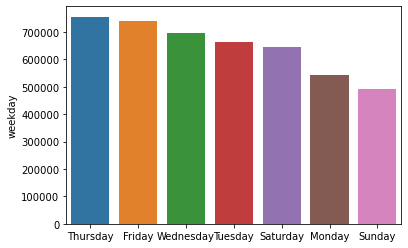

In [20]:
sns.barplot(x=df['weekday'].value_counts().index,
            y=df['weekday'].value_counts())
##MOST NUMBER OF JOURNEYS ON THURSDAY

Analysis of journey by hours

(array([216928., 103517., 227152., 543565., 324851., 366329., 819491.,
        660869., 579117., 692508.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <BarContainer object of 10 artists>)

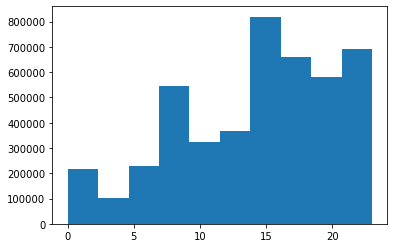

In [21]:
plt.hist(df['hour'])

##MOST NUMBER OF TRIPS IN THE EVENING 

Performing this analysis for every month

In [23]:
#Getting the unique months
df['month'].unique()

array([9, 5, 6, 7, 8, 4], dtype=int64)

In [24]:
for i,month in enumerate(df['month'].unique()):
    print(i)
    print(month)

0
9
1
5
2
6
3
7
4
8
5
4


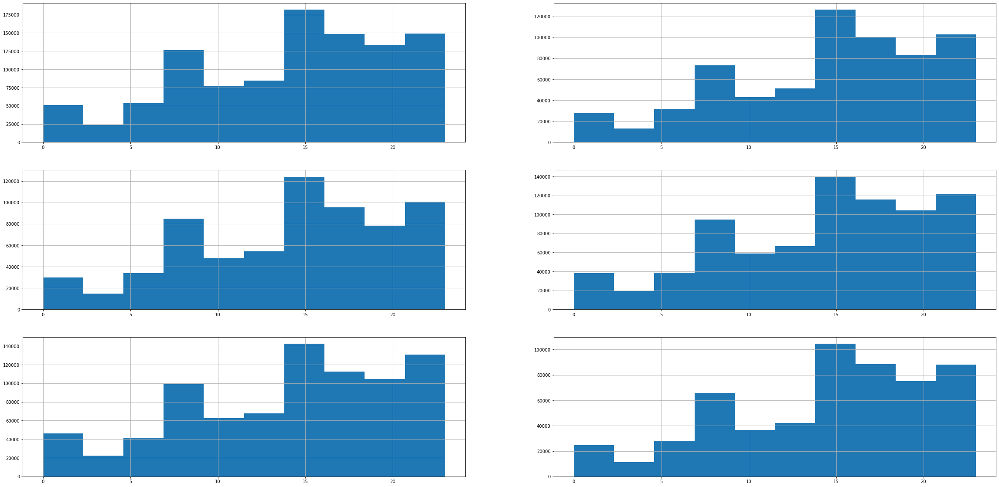

In [25]:
plt.figure(figsize=(40,20))

for i,month in enumerate(df['month'].unique()):
    plt.subplot(3,2,i+1)
    df[df['month']==month]['hour'].hist()
    
##IN ALMOST ALL CASES PEAK RUSH IS IN THE EVENING

Finding out which month has maximum users

In [26]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,1,9,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,1,9,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,3,9,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,6,9,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,11,9,0


In [28]:
df.groupby('month')['hour'].count()

month
4     564516
5     652435
6     663844
7     796121
8     829275
9    1028136
Name: hour, dtype: int64

[Text(0.5, 0, 'Month'), Text(0, 0.5, 'No. of trips in million')]

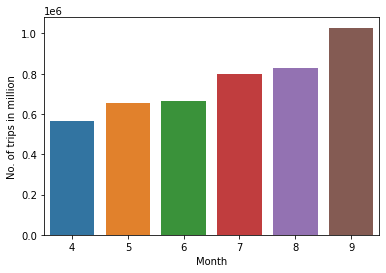

In [33]:
ax=sns.barplot(x=df.groupby('month')['hour'].count().index,
            y=df.groupby('month')['hour'].count())
ax.set(xlabel="Month",
       ylabel="No. of trips in million")

##MAIXIMUM RIDES IN THE MONTH OF SEPTEMBER

Analysis on journeys of each day

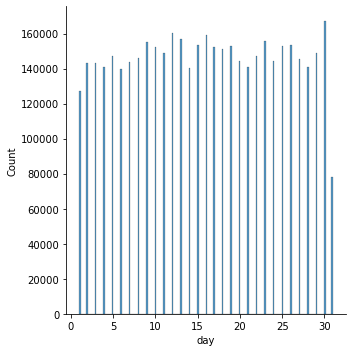

In [38]:
sns.displot(df["day"])

Text(0.5, 1.0, 'Trips on different days of month')

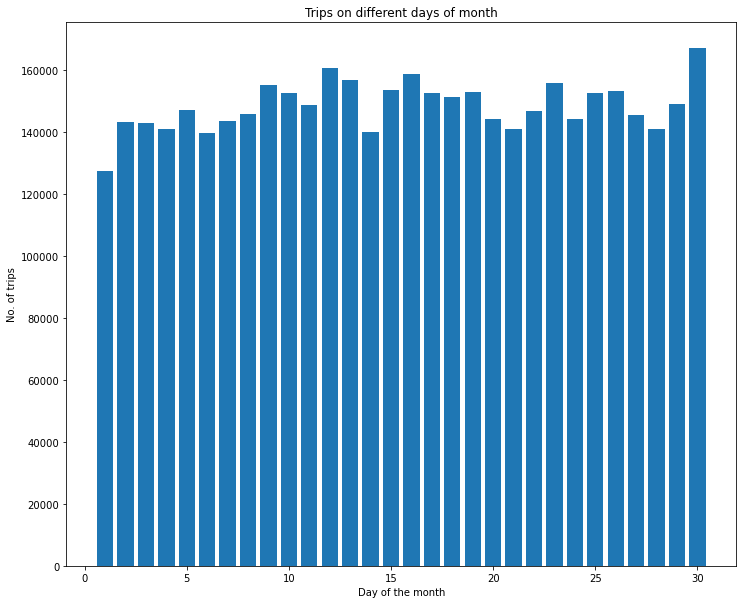

In [39]:
plt.figure(figsize=(12,10))
plt.hist(df["day"],bins=30,rwidth=0.8, range=(0.5,30.5))
plt.xlabel("Day of the month")
plt.ylabel("No. of trips")
plt.title("Trips on different days of month")

##THERE WAS A LOT OF DIFFERENCE BETWEEN THE DAYS BEFORE RANGE WAS APPIILED, 
##HOWEVER STILL THE MAXIMUM NUMBER OF TRIPS ARE ON 30TH OF EVERY MONTH.


Monthwise analysis of total rides

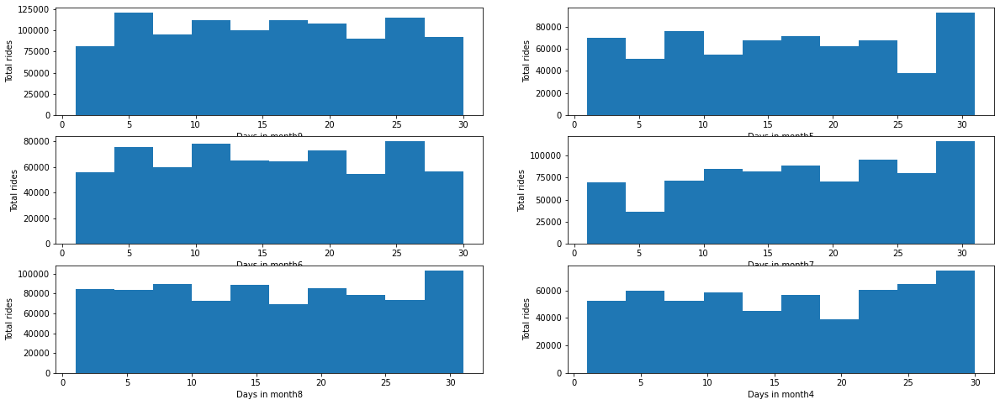

In [42]:
plt.figure(figsize=(20,8))
for i,month in enumerate(df["month"].unique(),1):
    plt.subplot(3,2,i)
    df_ans=df[df["month"]==month]
    plt.hist(df_ans["day"])
    plt.xlabel("Days in month{}".format(month))
    plt.ylabel("Total rides")

<AxesSubplot:xlabel='hour', ylabel='Lat'>

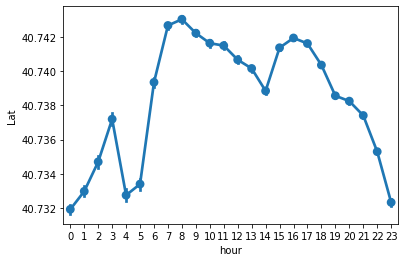

In [45]:
sns.pointplot(x="hour",y="Lat",data=df)

##pointplot without hue

Text(0.5, 1.0, 'Hours v/s Latitude')

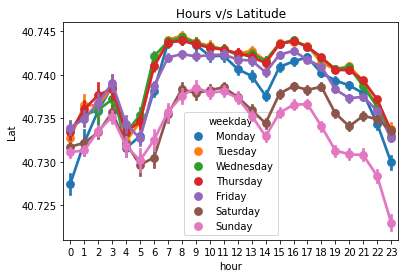

In [46]:
ax=sns.pointplot(x="hour",y="Lat",data=df, hue="weekday")
ax.set_title("Hours v/s Latitude")

##pointplot wiht hue

Finding out which base number gets popular by name

In [47]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,1,9,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,1,9,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,3,9,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,6,9,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,11,9,0


In [49]:
base=df.groupby(["Base","month"])["Date/Time"].count().reset_index()
base

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472
5,B02512,9,34370
6,B02598,4,183263
7,B02598,5,260549
8,B02598,6,242975
9,B02598,7,245597


<AxesSubplot:xlabel='month', ylabel='Date/Time'>

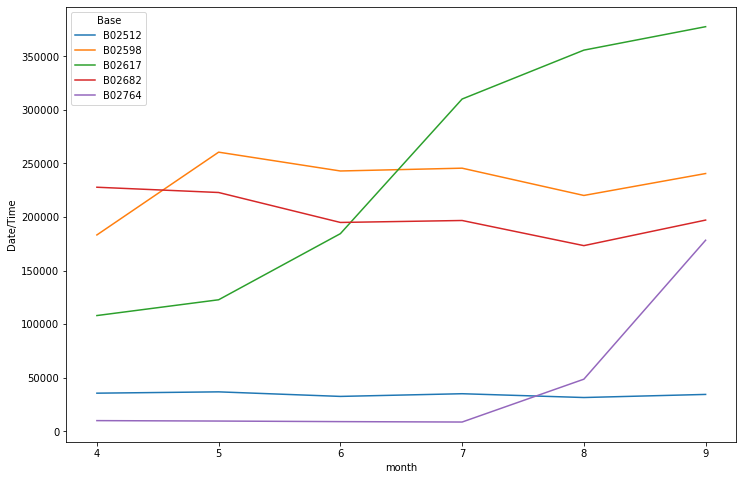

In [55]:
##Finding out which base number gets popular by month

plt.figure(figsize=(12,8))
sns.lineplot(x="month",y="Date/Time",hue="Base",data=base)

##B02617 gets popular by month

Performing cross analysis using heatmap

In [57]:
## heatmap by hour and weekday

def count_rows(rows):
    return len(rows)
    

In [59]:
by_cross=df.groupby(["weekday", "hour"]).apply(count_rows)
by_cross

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Length: 168, dtype: int64

In [60]:
##creating pivot table
pivot=by_cross.unstack()
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


<AxesSubplot:xlabel='hour', ylabel='weekday'>

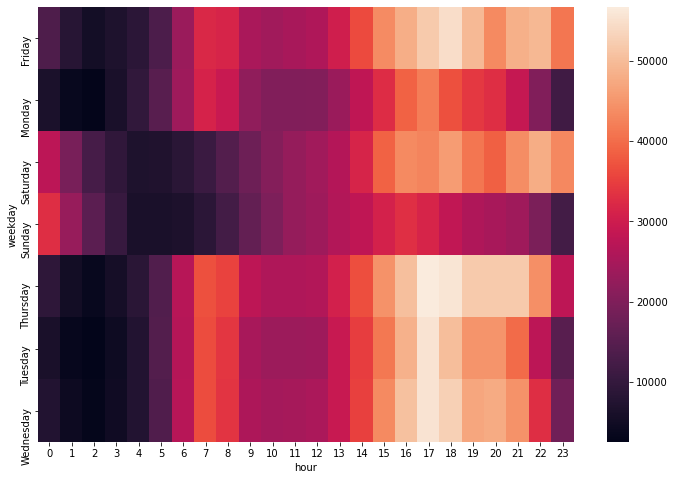

In [61]:
##creating heatmap
plt.figure(figsize=(12,8))
sns.heatmap(pivot)

##THERE IS A RUSH IN THE EVENINGS ON ALMOST ALL DAYS (EXCEPT SUNDAY) ESPECIALLY AROUND 18:00 HOURS

In [62]:
## heatmap by hour and day
## heatmap by month and day
## heatmap by month and weekday
## using a funtion

def heatmap(column1,column2):
    by_cross=df.groupby([column1,column2]).apply(count_rows)
    pivot=by_cross.unstack()
    plt.figure(figsize=(12,8))
    return sns.heatmap(pivot)
    

<AxesSubplot:xlabel='hour', ylabel='day'>

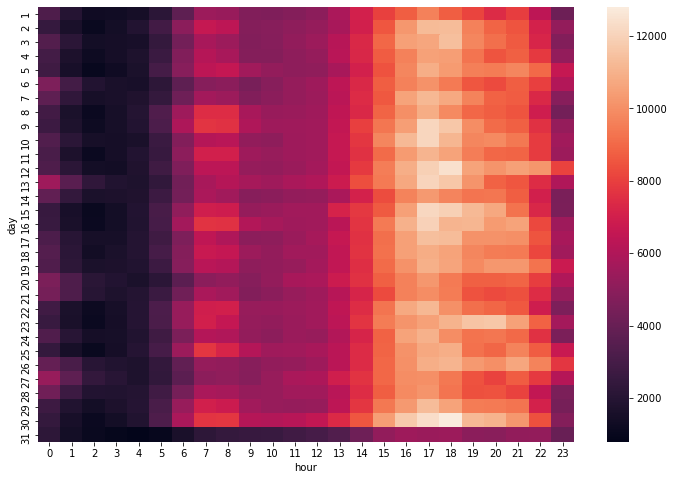

In [63]:
heatmap("day","hour")

##There's a lot of rush in the evening but not so much at midnight

<AxesSubplot:xlabel='month', ylabel='day'>

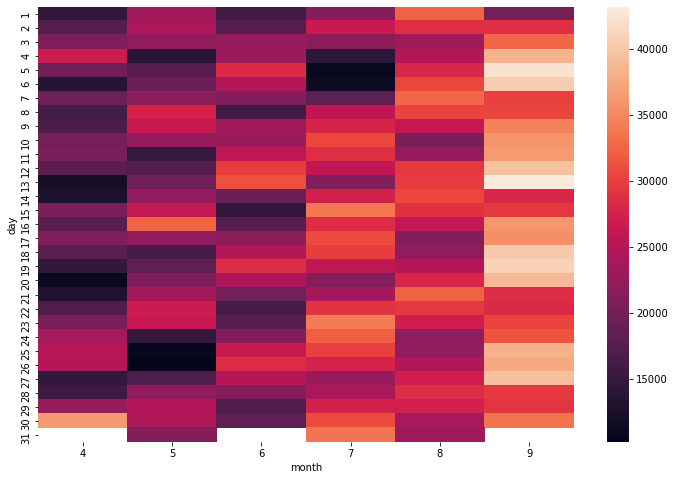

In [64]:
heatmap("day","month")

##Most number of trips are in September

<AxesSubplot:xlabel='month', ylabel='weekday'>

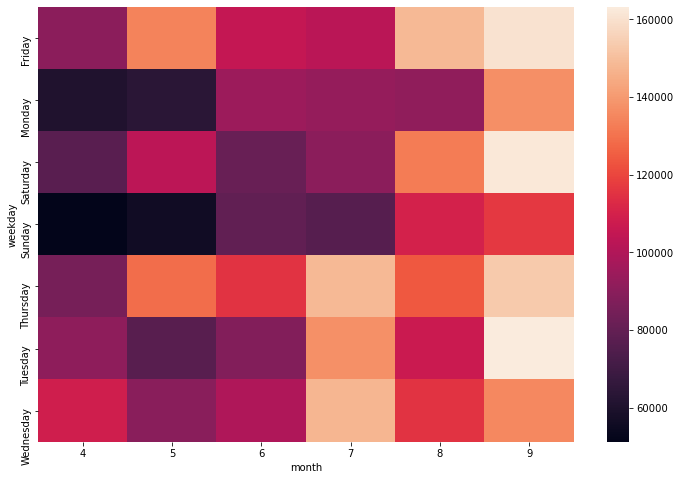

In [65]:
heatmap("weekday","month")

##Most number of trips are in September

Performing spatial analysis on demand of ubers

In [66]:
##Analysing location data points

df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,1,9,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,1,9,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,3,9,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,6,9,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,11,9,0


(40.6, 41.0)

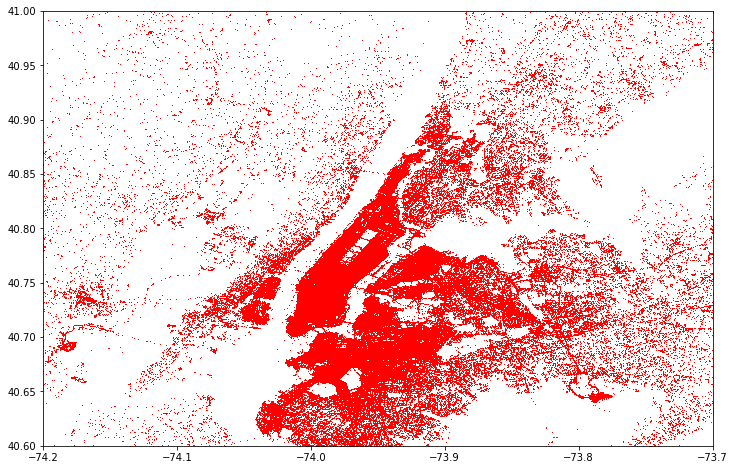

In [69]:
plt.figure(figsize=(12,8))
plt.plot(df["Lon"],df["Lat"],"r+",ms=0.5)
plt.xlim(-74.2,-73.7)
plt.ylim(40.6,41)

##There's a rush in region -74.0 to -73.9

In [70]:
##Performing spatial analysis to get a clear picture of the rush say on weekends

df_ans=df[df["weekday"]=="Sunday"]
df_ans.shape

(490180, 9)

In [71]:
df_ans.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
8011,2014-09-07 00:00:00,40.7341,-74.0005,B02512,Sunday,7,0,9,0
8012,2014-09-07 00:00:00,40.7344,-73.9900,B02512,Sunday,7,0,9,0
8013,2014-09-07 00:00:00,40.7806,-73.9582,B02512,Sunday,7,0,9,0
8014,2014-09-07 00:01:00,40.7293,-73.9859,B02512,Sunday,7,1,9,0
8015,2014-09-07 00:01:00,40.7713,-74.0133,B02512,Sunday,7,1,9,0


In [74]:
rush=df_ans.groupby(["Lat","Lon"])["weekday"].count().reset_index()
rush.columns=["Lat","Lon","No. of trips"]
rush

,Lat,Lon,No. of trips
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [75]:
pip install folium

Note: you may need to restart the kernel to use updated packages.Collecting folium



In [76]:
from folium.plugins import HeatMap

In [78]:
import folium
basemap=folium.Map()

In [79]:
HeatMap(rush, zoom=20, radii=15).add_to(basemap)
basemap

##Midtown Manhattan has the most number of rides

In [80]:
##Function to automate the above snippet of code
def plot(df,day):
    basemap=folium.Map()
    df_ans=df[df["weekday"]==day]
    HeatMap(df_ans.groupby(["Lat","Lon"])["weekday"].count().reset_index(), zoom=20, radius=15).add_to(basemap)
    return basemap
    

In [81]:
plot(df,"Saturday")

##Manhattan is has the highest bookings on Saturday

Analysing Uber pickups each month

In [83]:
uber_15=pd.read_csv(r"C:\Users\mlvka\OneDrive\Desktop\projects\Uber Trips Analysis/uber-raw-data-janjune-15.csv")

In [84]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [85]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [89]:
uber_15['Pickup_date'] =  pd.to_datetime(uber_15['Pickup_date'], format='%Y-%m-%d %H:%M:%S')

In [90]:
uber_15['weekday']=uber_15['Pickup_date'].dt.day_name()
uber_15['day']=uber_15['Pickup_date'].dt.day
uber_15['minute']=uber_15['Pickup_date'].dt.minute
uber_15['month']=uber_15['Pickup_date'].dt.month
uber_15['hour']=uber_15['Pickup_date'].dt.hour

In [92]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,weekday,day,minute,month,hour
0,B02617,2015-05-17 09:47:00,B02617,141,Sunday,17,47,5,9
1,B02617,2015-05-17 09:47:00,B02617,65,Sunday,17,47,5,9
2,B02617,2015-05-17 09:47:00,B02617,100,Sunday,17,47,5,9
3,B02617,2015-05-17 09:47:00,B02774,80,Sunday,17,47,5,9
4,B02617,2015-05-17 09:47:00,B02617,90,Sunday,17,47,5,9


<AxesSubplot:ylabel='month'>

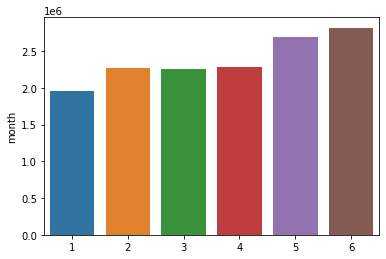

In [93]:
sns.barplot(x=uber_15["month"].value_counts().index,
            y=uber_15["month"].value_counts())
##Number of pickups in has been increasing steadily in the given year
##Maximum number of pickups is in June

Analysing rush in New York City

C:\Users\mlvka\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='hour', ylabel='count'>

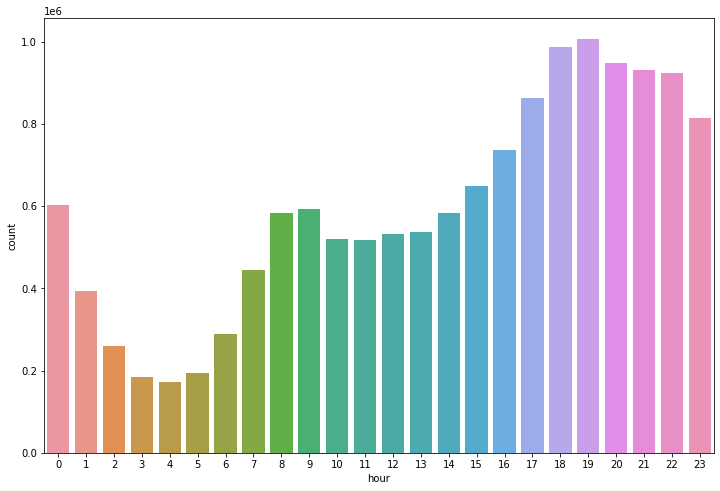

In [94]:
plt.figure(figsize=(12,8))
sns.countplot(uber_15["hour"])

##After the morning rush there is significant rise in demand in the evening

Analysing rush day and hour wise

In [96]:
summary=uber_15.groupby(['weekday', 'hour'])['Pickup_date'].count().reset_index()
summary.head()

,weekday,hour,Pickup_date
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


In [99]:
summary.columns=["weekday","hour","counts"]
summary=summary.rename(columns = {'Pickup_date':'Counts'})
summary.head()

,weekday,hour,counts
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


<AxesSubplot:xlabel='hour', ylabel='counts'>

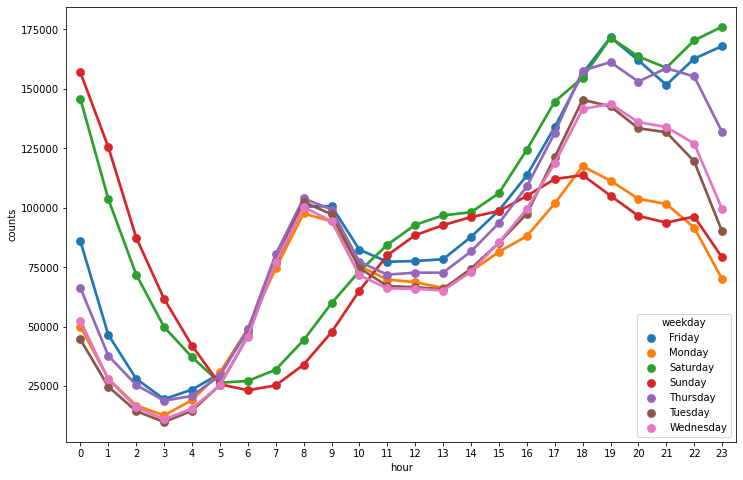

In [100]:
plt.figure(figsize=(12,8))
sns.pointplot(x="hour", y="counts", hue="weekday", data=summary)
##There's rush in the mornings on weekdays and its more than that on weekends

Analysing Base Number

In [4]:
uber_foil=pd.read_csv(r"C:\Users\mlvka\OneDrive\Desktop\projects\Uber Trips Analysis/Uber-Jan-Feb-FOIL.csv")

In [104]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [105]:
uber_foil.shape

(354, 4)

In [106]:
##Which base number has most active vehicles?

uber_foil["dispatching_base_number"].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

<AxesSubplot:xlabel='dispatching_base_number', ylabel='active_vehicles'>

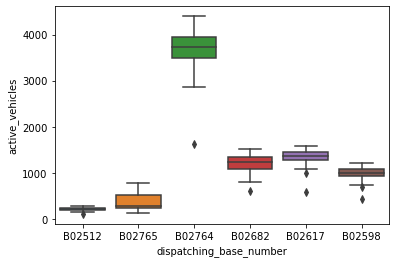

In [107]:
sns.boxplot(x="dispatching_base_number",y="active_vehicles",data=uber_foil)

##B02764 has maximum number of active vehicles

<AxesSubplot:xlabel='dispatching_base_number', ylabel='trips'>

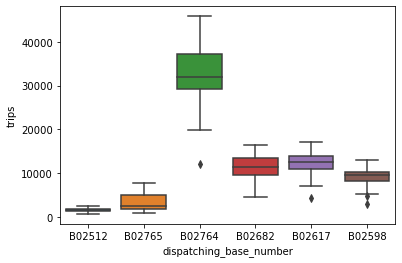

In [108]:
##Which base number has most trips?

sns.boxplot(x="dispatching_base_number",y="trips",data=uber_foil)

##B02764 has the most number of trips

In [6]:
## How average trips/vehicle inc/dec with each base number?

uber_foil["trips/vehicle"]=uber_foil["trips"]/uber_foil["active_vehicles"]

In [111]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips,trips/vehicle
0,B02512,1/1/2015,190,1132,5.957895
1,B02765,1/1/2015,225,1765,7.844444
2,B02764,1/1/2015,3427,29421,8.585060
3,B02682,1/1/2015,945,7679,8.125926
4,B02617,1/1/2015,1228,9537,7.766287


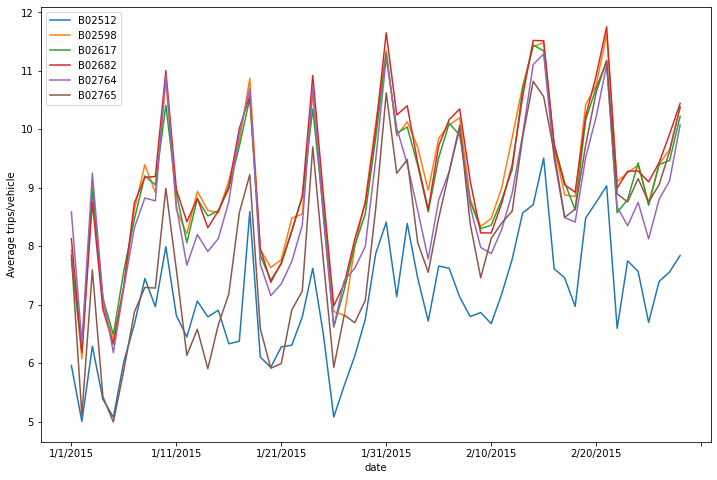

In [7]:
plt.figure(figsize=(12,8))
uber_foil.set_index('date').groupby(['dispatching_base_number'])['trips/vehicle'].plot()
plt.ylabel('Average trips/vehicle')
plt.legend()

##B02765(Purple one) and B02598(Orange one) are in great demand 
##B02512(Blue one) is not in much demand